In [1]:
import yt
import netCDF4 as nc
import pyart
import matplotlib.pyplot as plt
import pygrib
import numpy as np
import ipywidgets
%matplotlib inline
plt.rcParams['figure.dpi'] = 80


## You are using the Python ARM Radar Toolkit (Py-ART), an open source
## library for working with weather radar data. Py-ART is partly
## supported by the U.S. Department of Energy as part of the Atmospheric
## Radiation Measurement (ARM) Climate Research Facility, an Office of
## Science user facility.
##
## If you use this software to prepare a publication, please cite:
##
##     JJ Helmus and SM Collis, JORS 2016, doi: 10.5334/jors.119



In [2]:
img_trn = np.load('data/Hurricane_Tracker_data/hurricane_image_train.npy')
img_test = np.load('data/Hurricane_Tracker_data/hurricane_image_test.npy')
lab_trn = np.load('data/Hurricane_Tracker_data/hurricane_label_train.npy')
lab_test = np.load('data/Hurricane_Tracker_data/hurricane_label_test.npy')

In [3]:
img_trn

array([[[[[[5.14280617e-01, 5.08802712e-01, 4.89822388e-01,
            2.47114629e-04, 7.16396332e-01, 1.30627543e-01],
           [5.14240980e-01, 5.12240350e-01, 4.89832342e-01,
            3.13115277e-04, 7.18394637e-01, 1.33078679e-01],
           [5.14262438e-01, 5.13375342e-01, 4.91209507e-01,
            1.28002726e-02, 7.17629135e-01, 1.31941155e-01],
           ...,
           [5.13622999e-01, 4.67029870e-01, 4.77791458e-01,
            1.30515415e-04, 7.55665064e-01, 1.18148662e-01],
           [5.13424635e-01, 4.69144404e-01, 4.76764292e-01,
            2.81053708e-10, 7.54959106e-01, 1.17263563e-01],
           [5.13068199e-01, 4.71018642e-01, 4.75073934e-01,
            2.89401891e-10, 7.54358590e-01, 1.17666706e-01]],

          [[5.14149070e-01, 5.12442768e-01, 4.94736254e-01,
            2.75581173e-04, 7.17103958e-01, 1.31138846e-01],
           [5.13858438e-01, 5.14331520e-01, 4.96108413e-01,
            2.09540158e-04, 7.18954742e-01, 1.33557588e-01],
           [5.

In [4]:
img_test

array([[[[[[0.5142806 , 0.5088027 , 0.4898224 ],
           [0.514241  , 0.51224035, 0.48983234],
           [0.51426244, 0.51337534, 0.4912095 ],
           ...,
           [0.513623  , 0.46702987, 0.47779146],
           [0.51342463, 0.4691444 , 0.4767643 ],
           [0.5130682 , 0.47101864, 0.47507393]],

          [[0.51414907, 0.51244277, 0.49473625],
           [0.51385844, 0.5143315 , 0.4961084 ],
           [0.51357436, 0.51211613, 0.4929491 ],
           ...,
           [0.5133939 , 0.46793976, 0.47388068],
           [0.5130672 , 0.47074318, 0.4738997 ],
           [0.5127736 , 0.47269177, 0.47363082]],

          [[0.5136954 , 0.5177593 , 0.4983116 ],
           [0.5132907 , 0.5179871 , 0.5001061 ],
           [0.5127815 , 0.50919455, 0.4990588 ],
           ...,
           [0.5132824 , 0.470947  , 0.47136807],
           [0.51295376, 0.47348168, 0.47247148],
           [0.51259935, 0.4751562 , 0.47258747]],

          ...,

          [[0.582491  , 0.5146926 , 0.53893054],

In [5]:
img_test.shape

(28, 24, 10, 128, 257, 3)

In [6]:
lab_test.shape

(28, 24, 10, 128, 257, 1)

In [7]:
img_trn.shape

(142, 24, 10, 128, 257, 6)

In [8]:
lab_trn.shape

(142, 24, 10, 128, 257, 1)

In [9]:
img_test[0][0][0][0]

array([[0.5142806 , 0.5088027 , 0.4898224 ],
       [0.514241  , 0.51224035, 0.48983234],
       [0.51426244, 0.51337534, 0.4912095 ],
       [0.5146586 , 0.50762564, 0.4885728 ],
       [0.51427764, 0.5029512 , 0.48840225],
       [0.51425683, 0.5057685 , 0.48958796],
       [0.5142479 , 0.5114337 , 0.4949998 ],
       [0.51376253, 0.5116999 , 0.49877024],
       [0.51308537, 0.5182215 , 0.49568737],
       [0.51462054, 0.5198729 , 0.4896211 ],
       [0.51484704, 0.5077947 , 0.4861269 ],
       [0.51729214, 0.50601906, 0.49878198],
       [0.51900816, 0.4998148 , 0.51312935],
       [0.5203387 , 0.48722145, 0.5259412 ],
       [0.5204723 , 0.47578123, 0.5321543 ],
       [0.52834386, 0.5002842 , 0.5236668 ],
       [0.53116196, 0.50608414, 0.5100704 ],
       [0.52446145, 0.4928771 , 0.5428346 ],
       [0.5247653 , 0.5015784 , 0.54908115],
       [0.52331746, 0.50628054, 0.5559209 ],
       [0.52181137, 0.5061853 , 0.5556446 ],
       [0.52510655, 0.51242185, 0.5481061 ],
       [0.

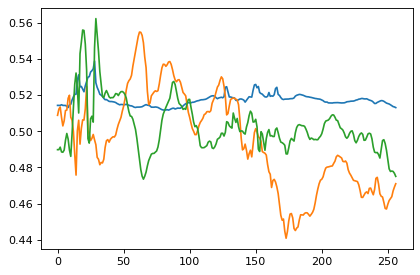

In [45]:
plt.plot(img_test[0][0][0][0])

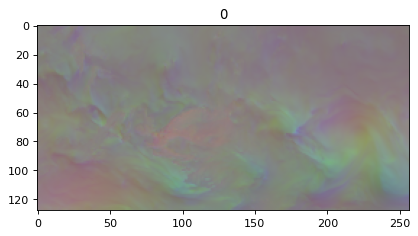

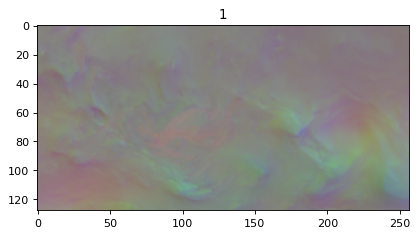

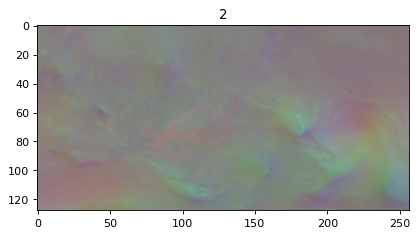

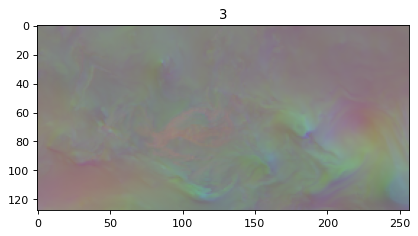

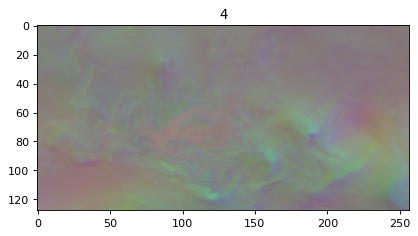

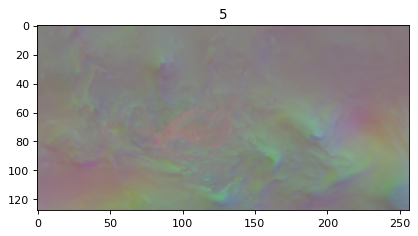

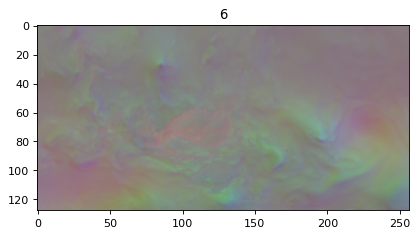

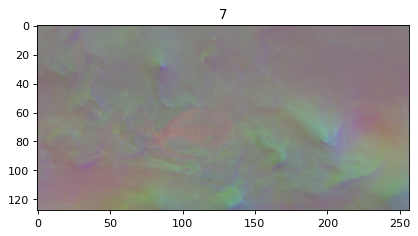

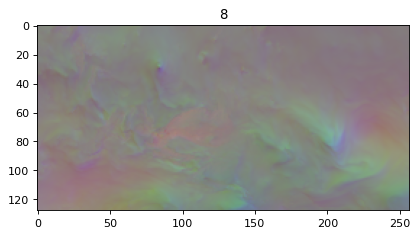

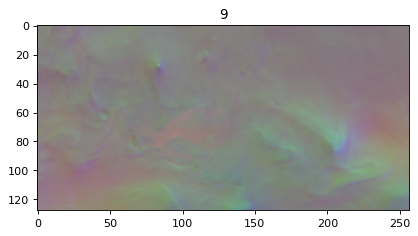

In [37]:
i = 0
while i < len(img_test[0][0]):
    plt.figure()
    plt.imshow(img_test[0][0][i])
    plt.title(i)
    i += 1

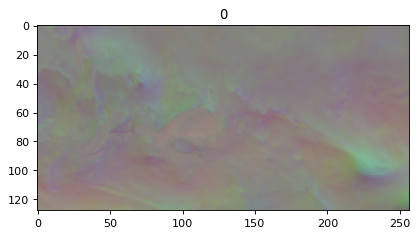

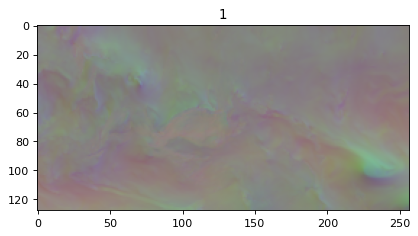

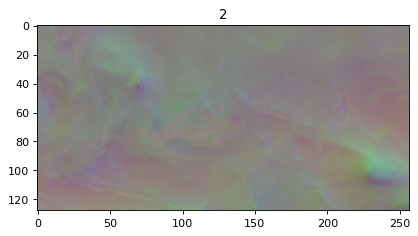

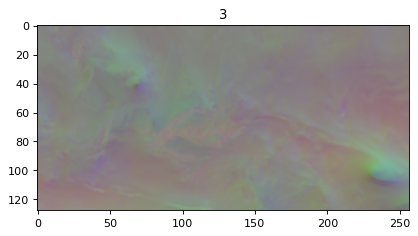

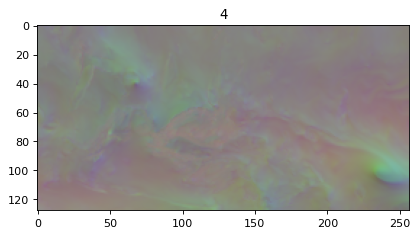

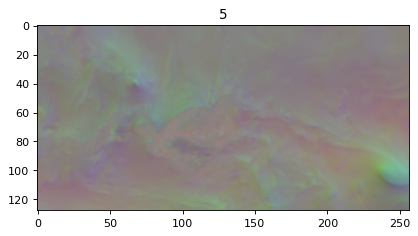

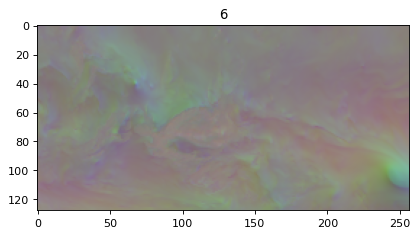

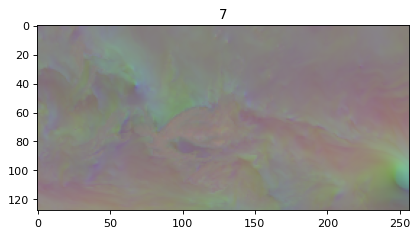

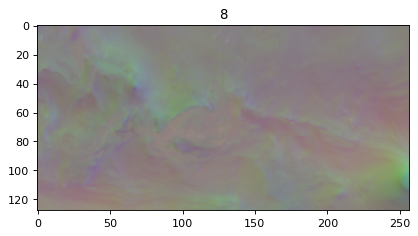

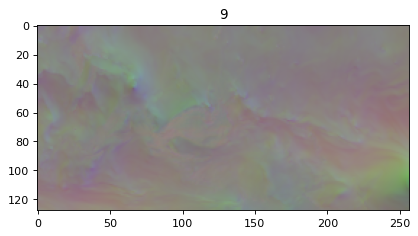

In [62]:
i = 0
while i < len(img_test[10][11]):
    plt.figure()
    plt.imshow(img_test[10][11][i])
    plt.title(i)
    i += 1

IndexError: index 10 is out of bounds for axis 0 with size 10

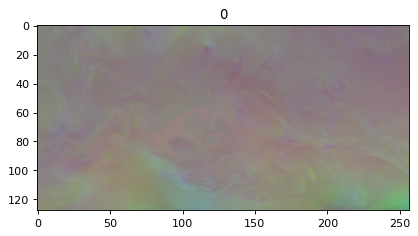

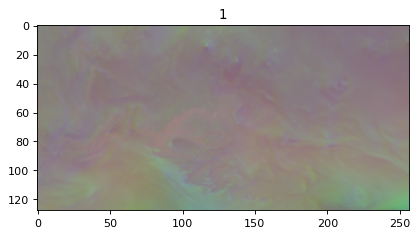

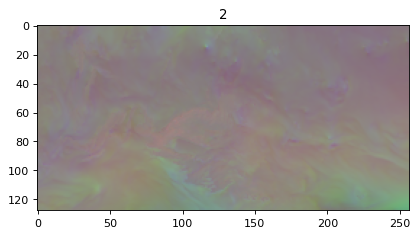

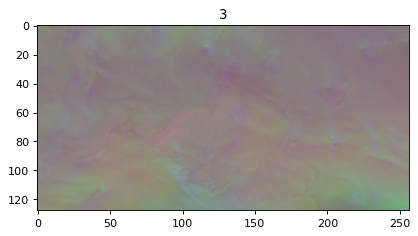

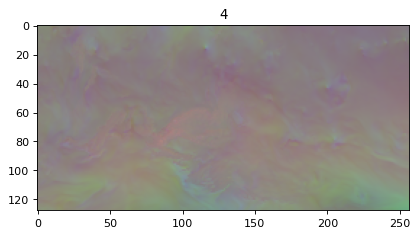

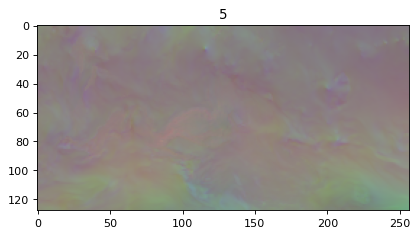

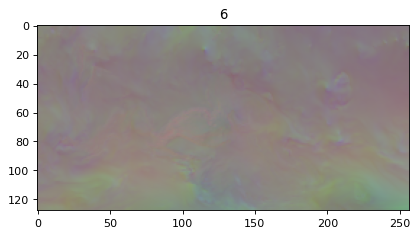

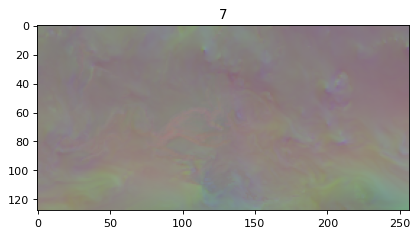

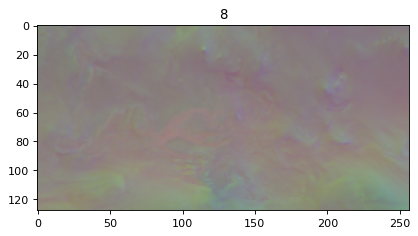

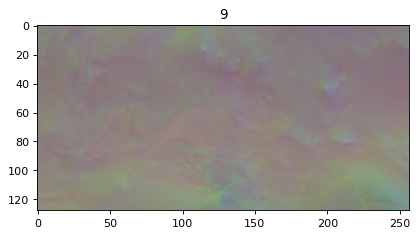

<Figure size 480x320 with 0 Axes>

In [85]:
i = 0
for i in range(len(img_trn[0])-1):
    plt.figure()
    plt.imshow(img_test[27][23][i])
    plt.title(i)
    i += 1

In [ ]:
img_trn[0][9].shape

interactive(children=(IntSlider(value=70, description='x', max=141), IntSlider(value=11, description='y', max=…

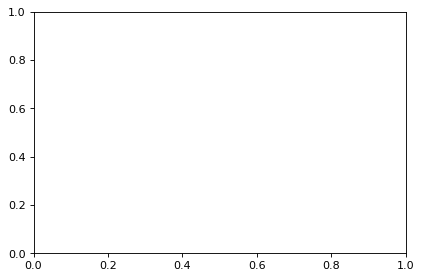

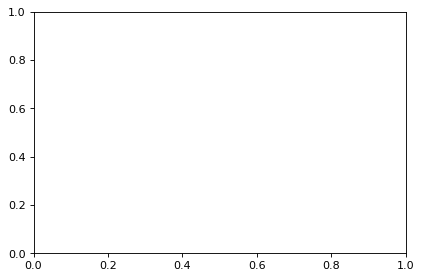

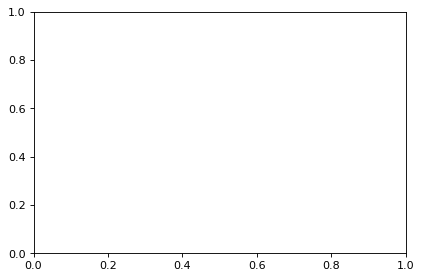

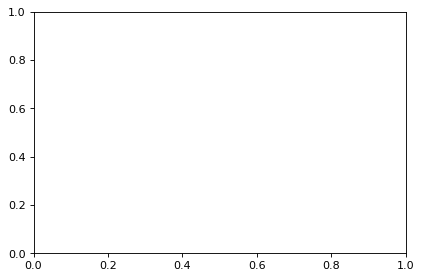

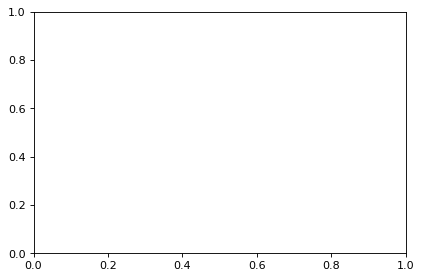

...

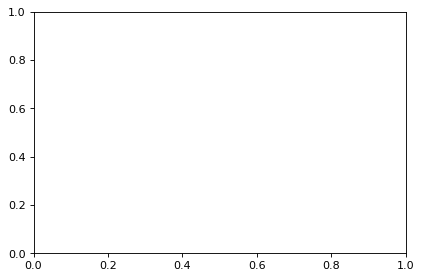

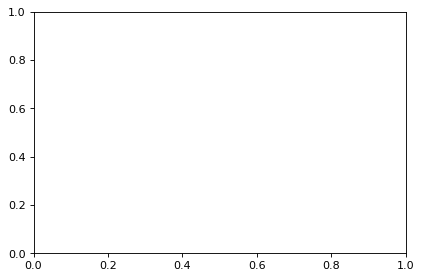

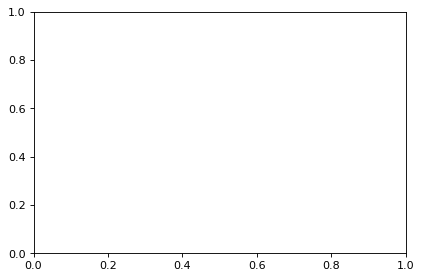

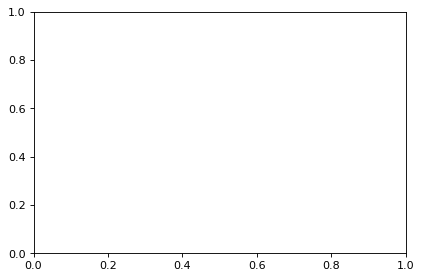

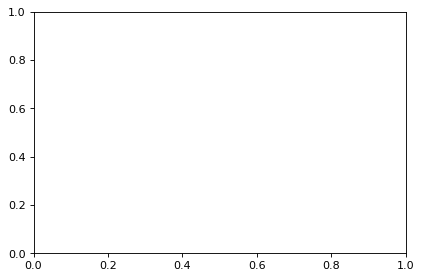

In [62]:
plt.rcParams['figure.dpi'] = 80

@ipywidgets.interact(x = (0,141,1), y =(0,23,1), z = (0,9,1))
# def print_array(x,y,z):
#     print(img_trn[x][y][z])
def make_plot(x,y,z):
    plt.clf
    plt.pcolormesh(img_trn[x][y][z])

    plt.title(f'{x},{y},{z}')

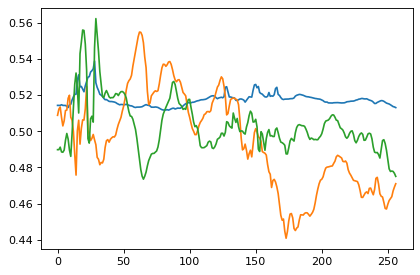

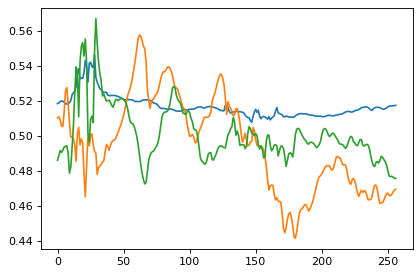

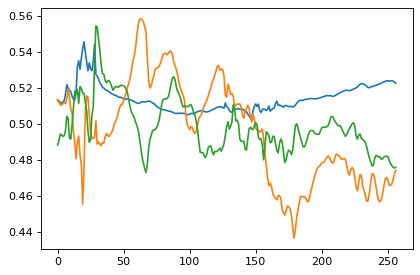

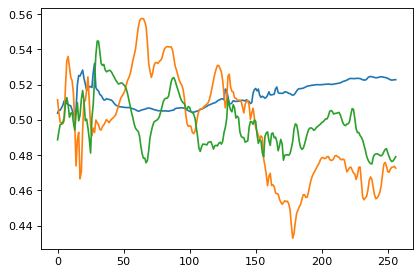

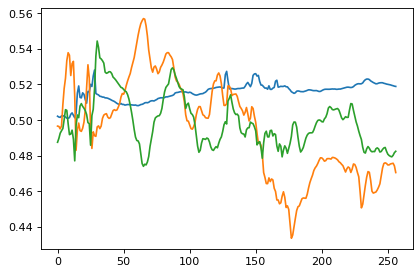

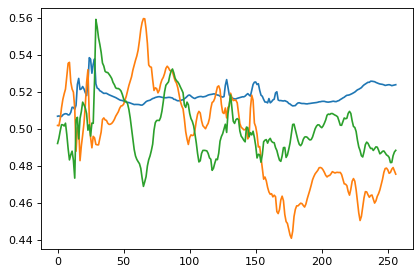

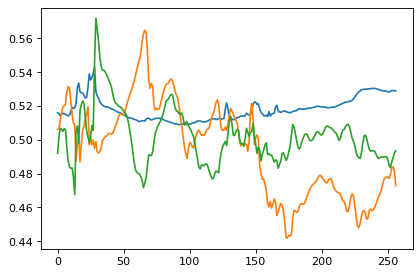

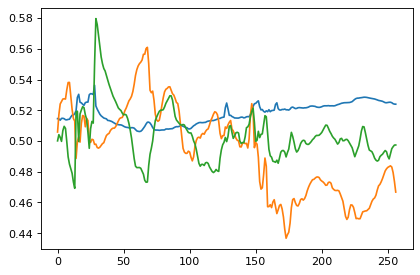

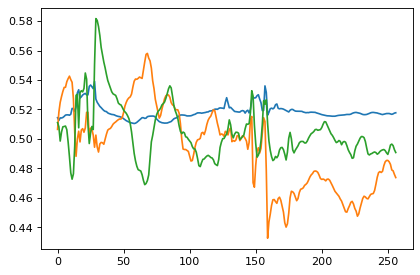

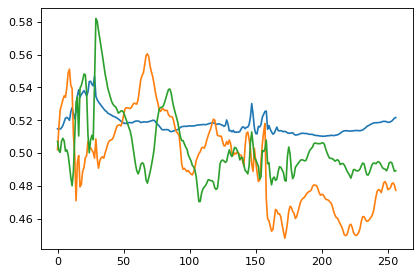

In [32]:
for i in img_test[0][0]:
    plt.plot(i[0])
    plt.show()

In [4]:
@ipywidgets.interact(i = (0,9,1))
def make_plot(i):
    plt.clf
    plt.plot(img_test[0][0][0][i])
    plt.ylim(0.4,0.6)
    plt.title(i)

interactive(children=(IntSlider(value=4, description='i', max=9), Output()), _dom_classes=('widget-interact',)…

In [13]:
img_test.shape

(28, 24, 10, 128, 257, 3)

In [14]:
print(img_test[0][0][0])

[[[0.5142806  0.5088027  0.4898224 ]
  [0.514241   0.51224035 0.48983234]
  [0.51426244 0.51337534 0.4912095 ]
  ...
  [0.513623   0.46702987 0.47779146]
  [0.51342463 0.4691444  0.4767643 ]
  [0.5130682  0.47101864 0.47507393]]

 [[0.51414907 0.51244277 0.49473625]
  [0.51385844 0.5143315  0.4961084 ]
  [0.51357436 0.51211613 0.4929491 ]
  ...
  [0.5133939  0.46793976 0.47388068]
  [0.5130672  0.47074318 0.4738997 ]
  [0.5127736  0.47269177 0.47363082]]

 [[0.5136954  0.5177593  0.4983116 ]
  [0.5132907  0.5179871  0.5001061 ]
  [0.5127815  0.50919455 0.4990588 ]
  ...
  [0.5132824  0.470947   0.47136807]
  [0.51295376 0.47348168 0.47247148]
  [0.51259935 0.4751562  0.47258747]]

 ...

 [[0.582491   0.5146926  0.53893054]
  [0.58360296 0.51666015 0.5309496 ]
  [0.58423215 0.5172576  0.52351123]
  ...
  [0.4915906  0.46664464 0.5433061 ]
  [0.49388757 0.46652514 0.549094  ]
  [0.49507886 0.4661943  0.5522344 ]]

 [[0.582775   0.52535045 0.53848195]
  [0.5837729  0.522921   0.526687  ]


In [15]:
for i in img_test[0][0][0][0]:
    print(i.min())

0.4898224
0.48983234
0.4912095
0.4885728
0.48840225
0.48958796
0.4949998
0.49877024
0.49568737
0.4896211
0.4861269
0.49878198
0.4998148
0.48722145
0.47578123
0.5002842
0.50608414
0.4928771
0.5015784
0.50628054
0.5061853
0.51242185
0.52470016
0.4959115
0.4934339
0.4948388
0.49608365
0.49821937
0.4952387
0.49254623
0.48556703
0.4845079
0.48151127
0.4827743
0.48249894
0.48452967
0.49104038
0.49477062
0.49537972
0.4939614
0.4955734
0.49636635
0.49695623
0.4968148
0.49794036
0.50112414
0.50376296
0.5057137
0.5076474
0.51101345
0.5137938
0.51467013
0.5149009
0.51438075
0.5108297
0.50840396
0.5082074
0.50665665
0.50372905
0.5010038
0.49619165
0.4904523
0.48433536
0.47883832
0.47520167
0.47352478
0.4751591
0.47744218
0.48090258
0.48382568
0.4855249
0.4873491
0.48774633
0.4877638
0.4884727
0.48911706
0.491309
0.49524403
0.50086415
0.5060625
0.50945663
0.51140106
0.51175517
0.51192284
0.51166064
0.51197475
0.5123735
0.5126744
0.51271504
0.5122862
0.5125603
0.51280004
0.5127084
0.5127448
0.513288

PSL (Sea level pressure), U850 (Zonal wind), V850 (Meridional wind), PRECT (Precipitation), TS (Surface temperature), QREFHT (Reference high humidity)

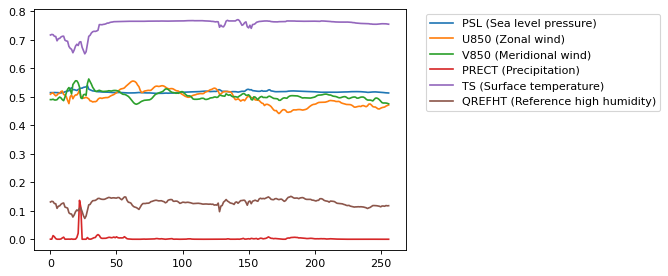

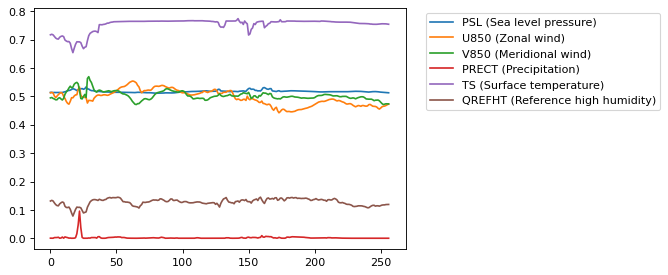

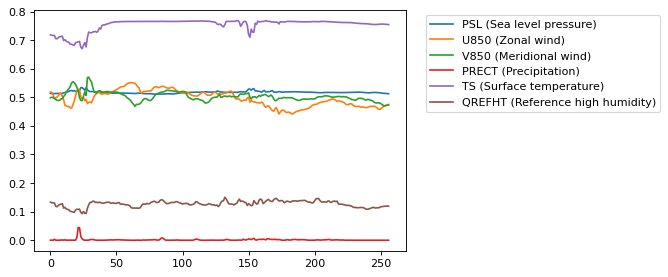

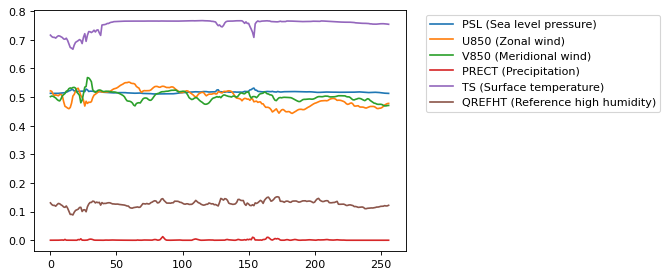

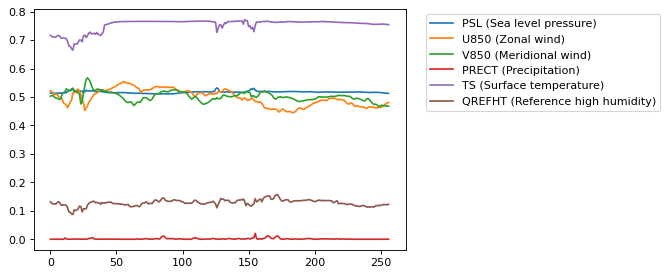

...

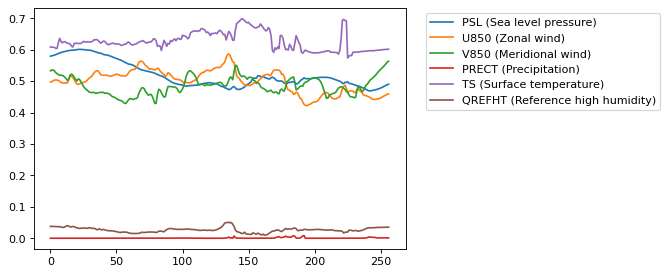

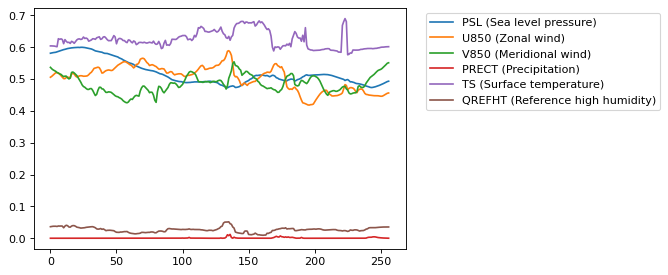

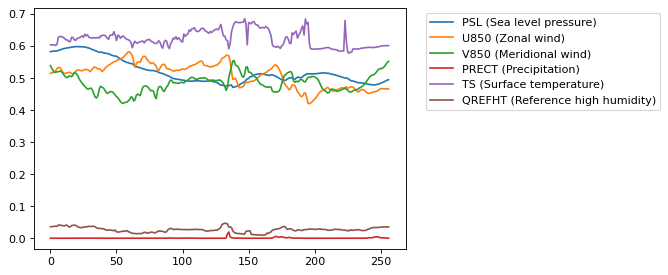

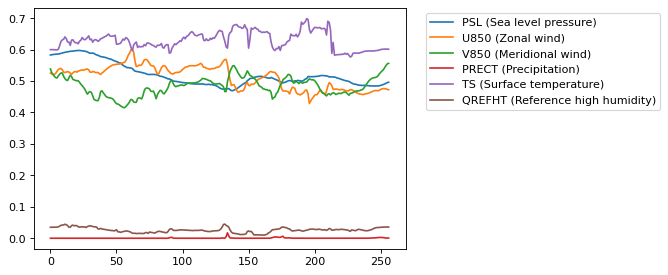

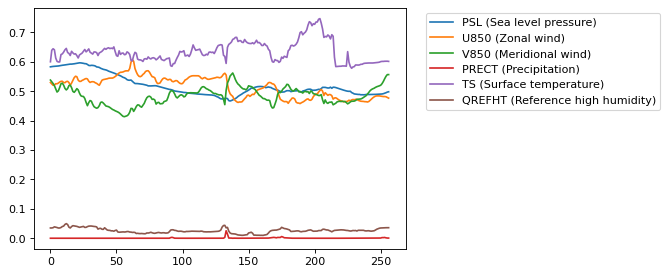

In [16]:
count = 0
for i in img_trn[0][0]:
    for x in i:
        while count <128 :
            plt.figure()
            plt.plot(i[count])
            count+=1
            plt.legend(('PSL (Sea level pressure)', 'U850 (Zonal wind)', 'V850 (Meridional wind)', 'PRECT (Precipitation)', 'TS (Surface temperature)', 'QREFHT (Reference high humidity)'),bbox_to_anchor=(1.04,1), loc="upper left")

            plt.show()

In [5]:
@ipywidgets.interact(i = (0,9,1))
def make_plot(i):
    plt.clf
    plt.plot(img_trn[0][0][0][i])
    plt.title(i)
    plt.legend(('PSL (Sea level pressure)', 'U850 (Zonal wind)', 'V850 (Meridional wind)', 'PRECT (Precipitation)', 'TS (Surface temperature)', 'QREFHT (Reference high humidity)'),bbox_to_anchor=(1.04,1), loc="upper left")


interactive(children=(IntSlider(value=4, description='i', max=9), Output()), _dom_classes=('widget-interact',)…

In [17]:
len(img_trn[0][0][9])

128

In [18]:
i = 0
for i in img_test[0,i,0,0]:
    plt.imshow(img_test[0,i,0,0])
    i += 1

IndexError: arrays used as indices must be of integer (or boolean) type

In [ ]:
var_index = (0,5)
for frame_index in range(img_test.shape[1]):
    plt.imshow( img_test[0, frame_index, :, :, var_index] )
    plt.savefig(f"something_{frame_index:04i}.png")

In [29]:
@ipywidgets.interact(frame_index = (0, img_test.shape[i] - 1), var_index = (0, 5))
def make_plot(frame_index, var_index):
    plt.clf()
    plt.imshow(img_test[0, frame_index, :, :, var_index])

NameError: name 'i' is not defined

, title = ['PSL (Sea level pressure)', 'U850 (Zonal wind)', 'V850 (Meridional wind)', 'PRECT (Precipitation)', 'TS (Surface temperature)', 'QREFHT (Reference high humidity)']

In [28]:
title = ['PSL (Sea level pressure)', 'U850 (Zonal wind)', 'V850 (Meridional wind)']
@ipywidgets.interact(width = (0, img_test.shape[0] - 1), height = (0, img_test.shape[1] - 1), time = (0, img_test.shape[2]-1), var_ind = (0, img_test.shape[-1] - 1))
def make_plot(width, height, time, var_ind):
    plt.clf()
    plt.pcolormesh(img_test[width, height, time, :, :, var_ind])
    plt.title(title[var_ind])

interactive(children=(IntSlider(value=13, description='width', max=27), IntSlider(value=11, description='heigh…

In [65]:
title = ['PSL (Sea level pressure)', 'U850 (Zonal wind)', 'V850 (Meridional wind)', 'PRECT (Precipitation)', 'TS (Surface temperature)', 'QREFHT (Reference high humidity)']
@ipywidgets.interact(width = (0, img_trn.shape[0] - 1), height = (0, img_trn.shape[1] - 1), time = (0, img_trn.shape[2]-1), var_ind = (0, img_trn.shape[-1] - 1))
def make_plot(width, height, time, var_ind):
    plt.clf()
    plt.pcolormesh(img_trn[width, height, time, :, :, var_ind])
    plt.title(title[var_ind])

interactive(children=(IntSlider(value=70, description='width', max=141), IntSlider(value=11, description='heig…

/Users/tzacks2/.conda/envs/DataViz/lib/python3.7/site-packages/ipywidgets/widgets/widget_output.py:111: DeprecationWarning: Kernel._parent_header is deprecated in ipykernel 6. Use .get_parent()
  if ip and hasattr(ip, 'kernel') and hasattr(ip.kernel, '_parent_header'):


In [64]:
@ipywidgets.interact(width = (0, lab_test.shape[0] - 1), height = (0, lab_test.shape[1] - 1), time = (0, lab_test.shape[2]-1))
def make_plot(width, height, time):
    plt.clf()
    plt.pcolormesh(lab_test[width, height, time, :, :, 0])

interactive(children=(IntSlider(value=13, description='width', max=27), IntSlider(value=11, description='heigh…

In [63]:
@ipywidgets.interact(width = (0, lab_trn.shape[0] - 1), height = (0, lab_trn.shape[1] - 1), time = (0, lab_trn.shape[2]-1))
def make_plot(width, height, time):
    plt.clf()
    plt.pcolormesh(lab_trn[width, height, time, :, :, 0])

interactive(children=(IntSlider(value=70, description='width', max=141), IntSlider(value=11, description='heig…

In [25]:
img_trn[0][0]

array([[[[5.14280617e-01, 5.08802712e-01, 4.89822388e-01,
          2.47114629e-04, 7.16396332e-01, 1.30627543e-01],
         [5.14240980e-01, 5.12240350e-01, 4.89832342e-01,
          3.13115277e-04, 7.18394637e-01, 1.33078679e-01],
         [5.14262438e-01, 5.13375342e-01, 4.91209507e-01,
          1.28002726e-02, 7.17629135e-01, 1.31941155e-01],
         ...,
         [5.13622999e-01, 4.67029870e-01, 4.77791458e-01,
          1.30515415e-04, 7.55665064e-01, 1.18148662e-01],
         [5.13424635e-01, 4.69144404e-01, 4.76764292e-01,
          2.81053708e-10, 7.54959106e-01, 1.17263563e-01],
         [5.13068199e-01, 4.71018642e-01, 4.75073934e-01,
          2.89401891e-10, 7.54358590e-01, 1.17666706e-01]],

        [[5.14149070e-01, 5.12442768e-01, 4.94736254e-01,
          2.75581173e-04, 7.17103958e-01, 1.31138846e-01],
         [5.13858438e-01, 5.14331520e-01, 4.96108413e-01,
          2.09540158e-04, 7.18954742e-01, 1.33557588e-01],
         [5.13574362e-01, 5.12116134e-01, 4.9294

In [26]:
img_trn.shape[1]

24

In [82]:
i = 1
for i in range(len(img_trn[0])):
    print(img_trn[0][i]-img_trn[0][i-1])

[[[[-1.70804262e-02 -2.02066898e-02 -2.37722397e-02 -7.51495361e-04
     1.54519081e-02  1.81480646e-02]
   [-1.70373917e-02 -2.59339809e-02 -2.01108456e-02 -2.28941441e-03
     1.06563568e-02  1.36190653e-02]
   [-1.75250769e-02 -2.57449150e-02 -1.92636251e-02  5.78105450e-03
     1.09095573e-02  1.37503147e-02]
   ...
   [-7.38859177e-03 -6.73818588e-03 -1.45442486e-02 -6.04391098e-05
    -5.54919243e-04 -9.80365276e-03]
   [-7.31372833e-03 -5.07700443e-03 -1.38581991e-02 -3.92675400e-04
    -8.77141953e-04 -9.68492031e-03]
   [-7.42030144e-03 -3.79478931e-03 -1.36083364e-02 -3.40938568e-04
    -1.45745277e-03 -6.40296936e-03]]

  [[-1.70284510e-02 -1.91671848e-02 -1.33485794e-02 -4.45485115e-04
     1.19938850e-02  1.46393776e-02]
   [-1.76464319e-02 -2.47185230e-02 -1.06965303e-02 -1.30999088e-03
     1.23924017e-02  1.54333115e-02]
   [-1.85928345e-02 -2.91374922e-02 -1.48248672e-02 -7.90166855e-03
     8.88085365e-03  1.20038986e-02]
   ...
   [-7.63022900e-03 -6.74641132e-03 -1.

[[[[-7.18617439e-03 -8.44979286e-03 -1.00731850e-03  5.35726547e-04
     1.65262222e-02  1.58522129e-02]
   [-7.85815716e-03  3.55720520e-04 -3.29244137e-03  1.61182880e-03
     1.76838636e-02  2.02699900e-02]
   [-7.91156292e-03  6.69896603e-03 -2.70688534e-03  1.70874596e-03
     4.15599346e-03  5.65838814e-03]
   ...
   [ 6.11555576e-03  1.32185221e-02 -3.82995605e-03  1.97505951e-03
     2.24113464e-05  6.66761398e-03]
   [ 6.41942024e-03  1.25610828e-02 -6.27255440e-03  2.18939781e-03
     1.69277191e-05  6.38449192e-03]
   [ 6.71529770e-03  1.15430355e-02 -7.14349747e-03  1.47128105e-03
     1.10864639e-05  4.18055058e-03]]

  [[-7.54737854e-03  1.50477886e-03 -7.38978386e-03  6.33955002e-04
     1.99782848e-02  2.11726427e-02]
   [-7.80653954e-03  4.35566902e-03 -9.98818874e-03  1.45995617e-03
     2.20605135e-02  2.41640806e-02]
   [-7.64894485e-03  1.18435621e-02 -1.36876106e-02  1.18744373e-03
     1.62875652e-02  1.75361633e-02]
   ...
   [ 5.54299355e-03  1.60543919e-02 -2.

KeyboardInterrupt: 

128


TypeError: Invalid shape (128, 257, 6) for image data

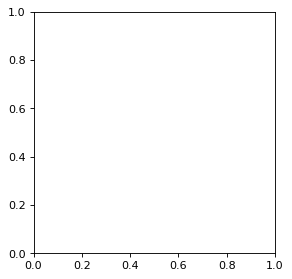